In [1]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import pandas as pd

In [3]:
import plotly.io as pio


In [11]:
df = pd.read_csv('sentiment - mentions.csv')

In [16]:
avg_sent = df.groupby('conversation_id').mean(numeric_only = True).sort_values('p_pos')

In [14]:
roots = pd.read_csv('sentiment - root_convos.csv')

In [61]:
word_cloud = roots.join(avg_sent, on ='conversation_id', how= 'inner')

In [66]:
word_cloud

,text,conversation_id,avg_prob,sentiment
0,rt with currently underway the conversation s...,1.592461e+18,0.924903,very positive
1,join us virtually in the pavilion at in 15 min...,1.592460e+18,0.457605,negative
2,1 in 4 children aged 5 have never attended pre...,1.592460e+18,0.985835,very positive
3,rt with currently underway the conversation s...,1.592460e+18,0.924903,very positive
4,the first vicepresident of the republic of meh...,1.592460e+18,0.229489,very negative
...,...,...,...,...
4252,speaking on behalf of education international ...,1.592163e+18,0.971836,very positive
4253,what is your image of in here is the closing ...,1.592162e+18,0.709225,positive
4254,i vented now i have to present it immortal mal...,1.592161e+18,0.919386,very positive
4255,location stone town fish market status airnod...,1.592160e+18,0.999999,very positive


In [62]:
word_cloud['sentiment'] = ''
word_cloud['sentiment'].mask((word_cloud['p_pos'] > 0.55) & (word_cloud['p_pos'] <= 0.65),'neutral',inplace=True)
word_cloud['sentiment'].mask((word_cloud['p_pos'] < 0.3),'very negative',inplace=True)
word_cloud['sentiment'].mask((word_cloud['p_pos'] > 0.3) & (word_cloud['p_pos'] <= 0.55),'negative',inplace=True)
word_cloud['sentiment'].mask((word_cloud['p_pos'] > 0.9),'very positive',inplace=True)
word_cloud['sentiment'].mask((word_cloud['p_pos'] > 0.65) & (word_cloud['p_pos'] <= 0.9),'positive',inplace=True)

In [63]:
word_cloud.rename(columns = {'p_pos':'avg_prob'}, inplace = True)

In [40]:
ids = list(word_cloud['conversation_id'])

In [42]:
word_cloud.set_index('conversation_id', inplace=True)

In [169]:
negs = word_cloud[word_cloud['sentiment']=='negative']

In [70]:
from wordcloud import WordCloud, STOPWORDS
import plotly.express as px
import matplotlib.pyplot as plt

In [170]:
text = ' '.join(negs['text'])

In [131]:
import re

In [171]:
text = re.sub(r'[^a-zA-Z0-9\s]','', text)

In [172]:
stop_words = STOPWORDS

In [173]:
stop_words.add('say')
stop_words.add('day')
stop_words.add('now')
stop_words.add('amp')

In [174]:
cloud = WordCloud(min_word_length=3, colormap = 'winter',max_words=100,width = 400, height = 200,prefer_horizontal = 0.95,
            background_color = 'white',collocations = False, stopwords=stop_words).generate(text)

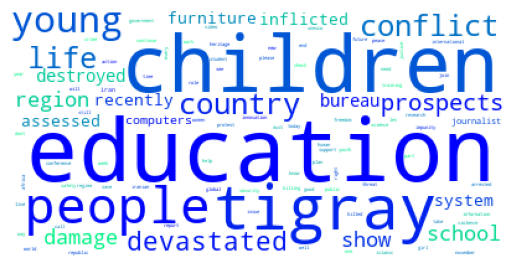

In [175]:
fig, ax = plt.subplots()
ax.axis('off')
ax.imshow(cloud)

In [225]:
new = pd.read_csv('tweets - daily_tweets.csv')

In [235]:
new['created_at'] =  pd.to_datetime(new['created_at'])

In [265]:
new.mean()

/var/folders/x3/ppg6hrln2pd32stss80svmq80000gn/T/ipykernel_19532/3789172717.py:1: FutureWarning:

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.



retweet_count     429.229692
reply_count        72.389356
like_count       1134.882353
quote_count        38.532213
dtype: float64

In [236]:
new.sort_values('created_at', inplace=True)
# rolling('7d').mean()

In [237]:
new['created_at'] =  new['created_at'].dt.normalize()

In [253]:
new = new.groupby('created_at',as_index=False).sum()

In [256]:
to_plot = new.rolling(7,on = 'created_at',min_periods = 1).mean()

In [262]:
(px.line(to_plot, x = 'created_at',y = ['like_count','retweet_count'],template = 'plotly_white',
    labels={"like_count": "likes",  "retweet_count": "retweets", "variable": "metric",'created_at':'date of tweet'
            })
.update_yaxes(title='count'))

In [ ]:
weeted'
            })
.update_yaxes(title='count'))

In [49]:
pd.DataFrame([data[i] for i in data], index=data.keys())

,words,sentiment
1.592461e+18,"[rt, , with, currently, underway, the, convers...","[very positive, very positive, very positive, ..."
1.592460e+18,"[join, us, virtually, in, the, pavilion, at, i...","[negative, negative, negative, negative, negat..."
1.592460e+18,"[1, in, 4, children, aged, 5, have, never, att...","[very positive, very positive, very positive, ..."
1.592460e+18,"[rt, , with, currently, underway, the, convers...","[very positive, very positive, very positive, ..."
1.592460e+18,"[the, first, vicepresident, of, the, republic,...","[very negative, very negative, very negative, ..."
...,...,...
1.592163e+18,"[speaking, on, behalf, of, education, internat...","[very positive, very positive, very positive, ..."
1.592162e+18,"[what, is, your, image, of, in, , here, is, th...","[positive, positive, positive, positive, posit..."
1.592161e+18,"[i, vented, now, i, have, to, present, it, imm...","[very positive, very positive, very positive, ..."
1.592160e+18,"[location, stone, town, fish, market, , status...","[very positive, very positive, very positive, ..."


In [29]:
dic = dict(zip(ids,))

23      1.592451e+18
37      1.592411e+18
50      1.592154e+18
84      1.592150e+18
100     1.590454e+18
            ...     
4189    1.589137e+18
4201    1.545430e+18
4221    1.545422e+18
4229    1.592185e+18
4230    1.592155e+18
Name: conversation_id, Length: 322, dtype: float64

In [28]:
roots[roots['conversation_id'].isin()]

,text,conversation_id
23,as part of dubai cares engagements at the worl...,1.592451e+18
37,this morning official opening of the 150 count...,1.592411e+18
50,fight illicit trafficking return amp restituti...,1.592154e+18
84,this baby doesnt know how to read and write ye...,1.592150e+18
100,13 deal all ensure all the childrens rights ar...,1.590454e+18
...,...,...
4189,the opening ceremony of the community center f...,1.589137e+18
4201,inspiring talk with minister luís roberto barr...,1.545430e+18
4221,great having minister luís roberto barroso at ...,1.545422e+18
4229,our ceo and vicechairman dr tariq al gurg took...,1.592185e+18


In [2]:
px.colors.qualitative.swatches()

In [2]:
df = pd.read_csv('tweets - unesco_tweets.csv',parse_dates=['created_at','bucket_idx'])

In [3]:
df['created_at'] = df['created_at'].dt.normalize()

In [4]:
to_plot = df.groupby('created_at',as_index=False).sum(numeric_only=True)

In [5]:
fig = make_subplots()#specs=[[{"secondary_y": True}]])

In [6]:
to_plot = to_plot[to_plot['like_count']<3000]

In [16]:
frames=[]
for f in range(1,len(to_plot)):
    x_axis = to_plot.loc[1:f,'created_at']
    curr_data = []
    # title_names = []
    # start = "For " + str(1800 + f + 1)
    for cont_ind in ['like_count','retweet_count']:
        # curr_metric = data.country[cont_ind]
        y_axis = to_plot.loc[1:f,cont_ind]#np.array(data.iloc[cont_ind,1:f+1])
        curr_data.append(go.Scatter(x = x_axis, y = y_axis,mode = "lines", name = cont_ind))
        # title_names.append(curr_metric + ": " + str(y_axis[f-1]/1000) + "K Dollar. ")
    title = 'Test'#start + " " + " ".join(title_names)
    curr_frame = go.Frame(data = curr_data, layout = {"title":title})
    frames.append(curr_frame)

In [20]:
frames

[Frame({
     'data': [{'mode': 'lines',
               'name': 'like_count',
               'type': 'scatter',
               'x': array([datetime.datetime(2021, 11, 4, 0, 0, tzinfo=<UTC>)], dtype=object),
               'y': array([1536])},
              {'mode': 'lines',
               'name': 'retweet_count',
               'type': 'scatter',
               'x': array([datetime.datetime(2021, 11, 4, 0, 0, tzinfo=<UTC>)], dtype=object),
               'y': array([628])}],
     'layout': {'title': {'text': 'Test'}}
 }),
 Frame({
     'data': [{'mode': 'lines',
               'name': 'like_count',
               'type': 'scatter',
               'x': array([datetime.datetime(2021, 11, 4, 0, 0, tzinfo=<UTC>),
                           datetime.datetime(2021, 11, 5, 0, 0, tzinfo=<UTC>)], dtype=object),
               'y': array([1536, 1302])},
              {'mode': 'lines',
               'name': 'retweet_count',
               'type': 'scatter',
               'x': array([datetime.da

In [17]:
initial_data = []
for cont_ind in ['like_count','retweet_count']:
    x_init = [to_plot.loc[0,'created_at']]
    y_axis = [to_plot.loc[1,cont_ind]]
    initial_data.append(go.Scatter(x =x_init, y = y_axis,mode = "lines",name = cont_ind))
initial_max = 600

In [18]:
figure = go.Figure(
    data = initial_data,
    layout = {
        "title":"Line Chart Race",
        # "xaxis":{ "visible":False, "showline":False},#"range":xaxis_range,
        # "yaxis":{"visible":False, "showline":False},
        "updatemenus":[{"type":"buttons","buttons":[{"method":"animate","label":"play", "args":[None]}]}]
        },
    frames = frames
    )

In [19]:
figure.show()

In [42]:
fig.add_trace(
    go.Scatter(x=to_plot['created_at'], y=to_plot['like_count'], name="like data"),
    # secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=to_plot['created_at'], y=to_plot['retweet_count'], name="retweet data"),
    # secondary_y=True,
)


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'name': 'like data',
              'type': 'scatter',
              'x': array([datetime.datetime(2021, 11, 3, 0, 0, tzinfo=<UTC>),
                          datetime.datetime(2021, 11, 4, 0, 0, tzinfo=<UTC>),
                          datetime.datetime(2021, 11, 5, 0, 0, tzinfo=<UTC>), ...,
                          datetime.datetime(2022, 10, 28, 0, 0, tzinfo=<UTC>),
                          datetime.datetime(2022, 10, 29, 0, 0, tzinfo=<UTC>),
                          datetime.datetime(2022, 10, 30, 0, 0, tzinfo=<UTC>)], dtype=object),
              'y': array([ 638, 1536, 1302, ..., 1241,  778,  727])},
             {'name': 'retweet data',
              'type': 'scatter',
              'x': array([datetime.datetime(2021, 11, 3, 0, 0, tzinfo=<UTC>),
                          datetime.datetime(2021, 11, 4, 0, 0, tzinfo=<UTC>),
                          datetime.datetime(2021, 11, 5, 0, 0, tzinfo=<UTC>), ...,
                          datetime.datetime(2022, 10, 28, 0, 0, tzinfo=<UTC>),
                          datetime.datetime(2022, 10, 29, 0, 0, tzinfo=<UTC>),
                          datetime.datetime(2022, 10, 30, 0, 0, tzinfo=<UTC>)], dtype=object),
              'y': array([298, 628, 511, ..., 350, 258, 201])}],
    'layout': {'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0]},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0]}}
})

In [35]:
import plotly.express as px

In [40]:
px.scatter(to_plot, x= 'created_at', y = ['retweet_count','like_count'],animation_frame='created_at',range_y = [0,4000])

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'variable=like_count<br>created_at=%{x}<br>value=%{y}<extra></extra>',
              'ids': array([298]),
              'legendgroup': 'like_count',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'markers',
              'name': 'like_count',
              'orientation': 'v',
              'showlegend': True,
              'type': 'scatter',
              'x': array([datetime.datetime(2021, 11, 3, 0, 0, tzinfo=<UTC>)], dtype=object),
              'xaxis': 'x',
              'y': array([638]),
              'yaxis': 'y'}],
    'frames': [{'data': [{'hovertemplate': 'variable=like_count<br>created_at=%{x}<br>value=%{y}<extra></extra>',
                          'ids': array([298]),
                          'legendgroup': 'like_count',
                          'marker': {'color': '#636efa', 'symbol': 'circle'},
                          'mode': 'markers',
                          'name': 'like_count',
                          'orientation': 'v',
                          'showlegend': True,
                          'type': 'scatter',
                          'x': array([datetime.datetime(2021, 11, 3, 0, 0, tzinfo=<UTC>)], dtype=object),
                          'xaxis': 'x',
                          'y': array([638]),
                          'yaxis': 'y'}],
                'name': '2021-11-03 00:00:00+00:00'},
               {'data': [{'hovertemplate': 'variable=like_count<br>created_at=%{x}<br>value=%{y}<extra></extra>',
                          'ids': array([628]),
                          'legendgroup': 'like_count',
                          'marker': {'color': '#636efa', 'symbol': 'circle'},
                          'mode': 'markers',
                          'name': 'like_count',
                          'orientation': 'v',
                          'showlegend': True,
                          'type': 'scatter',
                          'x': array([datetime.datetime(2021, 11, 4, 0, 0, tzinfo=<UTC>)], dtype=object),
                          'xaxis': 'x',
                          'y': array([1536]),
                          'yaxis': 'y'}],
                'name': '2021-11-04 00:00:00+00:00'},
               {'data': [{'hovertemplate': 'variable=like_count<br>created_at=%{x}<br>value=%{y}<extra></extra>',
                          'ids': array([511]),
                          'legendgroup': 'like_count',
                          'marker': {'color': '#636efa', 'symbol': 'circle'},
                          'mode': 'markers',
                          'name': 'like_count',
                          'orientation': 'v',
                          'showlegend': True,
                          'type': 'scatter',
                          'x': array([datetime.datetime(2021, 11, 5, 0, 0, tzinfo=<UTC>)], dtype=object),
                          'xaxis': 'x',
                          'y': array([1302]),
                          'yaxis': 'y'}],
                'name': '2021-11-05 00:00:00+00:00'},
               {'data': [{'hovertemplate': 'variable=like_count<br>created_at=%{x}<br>value=%{y}<extra></extra>',
                          'ids': array([270]),
                          'legendgroup': 'like_count',
                          'marker': {'color': '#636efa', 'symbol': 'circle'},
                          'mode': 'markers',
                          'name': 'like_count',
                          'orientation': 'v',
                          'showlegend': True,
                          'type': 'scatter',
                          'x': array([datetime.datetime(2021, 11, 6, 0, 0, tzinfo=<UTC>)], dtype=object),
                          'xaxis': 'x',
                          'y': array([760]),
                          'yaxis': 'y'}],
                'name': '2021-11-06 00:00:00+00:00'},
               {'data': [{'hovertemplate': 'variable=like_count<br>created_at=%{x}<br>value=%{y}<extra></extra>',
                          'ids

In [21]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

import plotly.io as pio
pio.templates.default = "simple_white"
data = pd.read_csv(r"https://raw.githubusercontent.com/datageekrj/ForHostingFiles/master/income_per_person_gdppercapita_ppp_inflation_adjusted.csv")



numOfRows = data.shape[0] # No of Countries
numOfCols = data.shape[1] # No of years + one column for a country
numOfFrames = numOfCols - 1
xaxis_range = [0,numOfFrames + 2]

# While, testing the code, test with low numbers:
# Initial State of the data
# First we are just seeing it for afghanistan

x_init = np.array([1])


initial_data = []
for cont_ind in [75,35,184,83,140]:
    y_axis = np.array(data.iloc[cont_ind,0])
    initial_data.append(go.Scatter(x =x_init, y = y_axis,mode = "lines",name = data.country[cont_ind]))
initial_max = 600

# Frames
frames = []
for f in range(1,numOfFrames+1):
    x_axis = np.arange(1,f+1)
    curr_data = []
    title_names = []
    start = "For " + str(1800 + f + 1)
    for cont_ind in [75,35,184,83,140]:
        curr_country = data.country[cont_ind]
        y_axis = np.array(data.iloc[cont_ind,1:f+1])
        curr_data.append(go.Scatter(x = x_axis, y = y_axis,mode = "lines", name = curr_country))
        title_names.append(curr_country + ": " + str(y_axis[f-1]/1000) + "K Dollar. ")
    title = start + " " + " ".join(title_names)
    curr_frame = go.Frame(data = curr_data, layout = {"title":title})
    frames.append(curr_frame)
 
figure = go.Figure(
    data = initial_data,
    layout = {
        "title":"Line Chart Race",
        "xaxis":{"range":xaxis_range, "visible":False, "showline":False},
        "yaxis":{"type":"log", "visible":False, "showline":False},
        "updatemenus":[{"type":"buttons","buttons":[{"method":"animate","label":"play", "args":[None]}]}]
        },
    frames = frames
    )
figure.show()

In [22]:
frames

[Frame({
     'data': [{'mode': 'lines', 'name': 'India', 'type': 'scatter', 'x': array([1]), 'y': array([863], dtype=object)},
              {'mode': 'lines', 'name': 'China', 'type': 'scatter', 'x': array([1]), 'y': array([736], dtype=object)},
              {'mode': 'lines',
               'name': 'United States',
               'type': 'scatter',
               'x': array([1]),
               'y': array([1980], dtype=object)},
              {'mode': 'lines', 'name': 'Japan', 'type': 'scatter', 'x': array([1]), 'y': array([1010], dtype=object)},
              {'mode': 'lines', 'name': 'Russia', 'type': 'scatter', 'x': array([1]), 'y': array([1430], dtype=object)}],
     'layout': {'title': {'text': ('For 1802 India: 0.863K Dollar.' ... 'ollar.  Russia: 1.43K Dollar. ')}}
 }),
 Frame({
     'data': [{'mode': 'lines',
               'name': 'India',
               'type': 'scatter',
               'x': array([1, 2]),
               'y': array([863, 862], dtype=object)},
              